# sgis
https://github.com/statisticsnorway/ssb-sgis

Åpne heller notebooken her: https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/ssb_sgis.ipynb

In [1]:
# midlr.
import sys
sys.path.insert(0, r"C:\Users\ort\git\ssb-sgis\src")
import geopandas as gpd
import pandas as pd
import numpy as np
import sgis as sg

For å installere:

poetry add ssb-sgis

Eller:

pip install ssb-sgis

## Pakken inneholder:
- Funksjoner for bedre kartlegging
- Nettverksanalyse
- GIS-funksjoner som mangler i geopandas
- Forbedringer av geopandas-funksjoner

# Kartlegging

In [2]:
punkter = sg.read_parquet_url(
    "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/points_oslo.parquet"
)

punkter

,idx,geometry
0,1,POINT (263122.700 6651184.900)
1,2,POINT (272456.100 6653369.500)
2,3,POINT (270082.300 6653032.700)
3,4,POINT (259804.800 6650339.700)
4,5,POINT (272876.200 6652889.100)
...,...,...
995,996,POINT (266801.700 6647844.500)
996,997,POINT (261274.000 6653593.400)
997,998,POINT (263542.900 6645427.000)
998,999,POINT (269226.700 6650628.000)


Lager fem GeoDataFrames med et utvalg av punktene, bufrer, lager areal-kolonne:

In [3]:
punkter100 = sg.buff(punkter.sample(40), 100).assign(areal=lambda df: df.area)
punkter200 = sg.buff(punkter.sample(30), 200).assign(areal=lambda df: df.area)
punkter300 = sg.buff(punkter.sample(20), 300).assign(areal=lambda df: df.area)
punkter400 = sg.buff(punkter.sample(10), 400).assign(areal=lambda df: df.area)
punkter500 = sg.buff(punkter.sample(5), 500).assign(areal=lambda df: df.area)

Her er geopandas' explore med to GeoDataFrames:

In [4]:
pd.concat(
    [
    punkter100.assign(label="punkter100"), 
    punkter200.assign(label="punkter200")
    ]
).explore("label")

Her er et alternativ:

In [5]:
sg.explore(punkter200, punkter100)

#### sgis.explore: Interaktivt kart av én eller flere GeoDataFrames.
- Kan huke av/på kartlagene
- Flere bakgrunnskart
- Bedre fargepalett
- Kan zoome mer

In [6]:
sg.explore(punkter500, punkter400, punkter300, punkter200, punkter100)

In [7]:
sg.explore(punkter500, punkter400, punkter300, punkter200, punkter100, "areal")

c:\Users\ort\AppData\Local\Programs\Python\Python311\Lib\site-packages\mapclassify\classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


Hvis dataene er for tunge til å vises samtidig. For eksempel:

In [8]:
veger_oslo = sg.read_parquet_url(
    "https://media.githubusercontent.com/media/statisticsnorway/ssb-sgis/main/tests/testdata/roads_oslo_2022.parquet"
)

veger_oslo = veger_oslo[["oneway", "drivetime_fw", "drivetime_bw", "roadid", "geometry"]]

veger_oslo

,oneway,drivetime_fw,drivetime_bw,roadid,geometry
119702,B,0.216611,0.216611,{S944},MULTILINESTRING Z ((258028.440 6674249.890 413...
199710,FT,0.099323,-1.000000,{R163},MULTILINESTRING Z ((271778.700 6653238.900 138...
199725,FT,0.173963,-1.000000,{R163},MULTILINESTRING Z ((271884.510 6653207.540 142...
199726,FT,0.011827,-1.000000,{R163},MULTILINESTRING Z ((271884.510 6653207.540 142...
199733,FT,0.009097,-1.000000,{R163},MULTILINESTRING Z ((271877.373 6653214.697 141...
...,...,...,...,...,...
1944129,FT,0.010482,-1.000000,{R191},MULTILINESTRING Z ((268649.503 6651869.320 111...
1944392,B,0.135561,0.135561,{P10977},MULTILINESTRING Z ((259501.570 6648459.580 3.2...
1944398,B,0.068239,0.068239,{P11967},MULTILINESTRING Z ((258292.600 6648313.440 18....
1944409,B,0.023629,0.023629,{P11967},MULTILINESTRING Z ((258291.452 6648289.258 19....


Lager først en kolonne for vegtype.

In [9]:
veger_oslo["category"] = veger_oslo.roadid.str[1] # henter ut bokstav nr 2
veger_oslo[["category", "roadid"]]

,category,roadid
119702,S,{S944}
199710,R,{R163}
199725,R,{R163}
199726,R,{R163}
199733,R,{R163}
...,...,...
1944129,R,{R191}
1944392,P,{P10977}
1944398,P,{P11967}
1944409,P,{P11967}


Og kartlegger et tilfeldig område.

In [10]:
sg.samplemap(veger_oslo, "category")

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(


Kartlegg utvalgt område.

In [11]:
maske = punkter.iloc[[0]].buffer(300)
sg.clipmap(veger_oslo, "category", mask=maske)

{0: '__'}


C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(


## Nettverksanalyse

In [12]:
nw = (
    sg.DirectedNetwork(veger_oslo)
    .remove_isolated()
    .make_directed_network_norway()
)

rules = sg.NetworkAnalysisRules(weight="minutes")

nwa = sg.NetworkAnalysis(network=nw, rules=rules)

nwa

NetworkAnalysis(
    network=DirectedNetwork(6364 km, percent_bidirectional=87),
    rules=NetworkAnalysisRules(weight=minutes, search_tolerance=250, search_factor=0, split_lines=False, ...),
    log=True, detailed_log=True,
)

In [69]:
origins = punkter.loc[:99, ["geometry"]]
origins["KOMMUNENR"] = "0301"

origins = origins.reindex(columns=[c for c in origins.columns if c != "geometry"] + ["geometry"])

origins

,origin_idx,KOMMUNENR,geometry
0,0,0301,POINT (263122.700 6651184.900)
1,1,0301,POINT (272456.100 6653369.500)
2,2,0301,POINT (270082.300 6653032.700)
3,3,0301,POINT (259804.800 6650339.700)
4,4,0301,POINT (272876.200 6652889.100)
...,...,...,...
95,95,0301,POINT (270348.000 6651899.400)
96,96,0301,POINT (264845.600 6649005.800)
97,97,0301,POINT (263162.000 6650732.200)
98,98,0301,POINT (272322.700 6653729.100)


In [71]:
destinations = punkter.loc[100:199, ["geometry"]]

destinations["KOMMUNENR"] = "0301"

destinations = destinations.reindex(columns=[c for c in destinations.columns if c != "geometry"] + ["geometry"])

destinations

,destination_idx,KOMMUNENR,geometry
100,100,0301,POINT (265997.900 6647899.400)
101,101,0301,POINT (263835.200 6648677.700)
102,102,0301,POINT (265764.000 6644063.900)
103,103,0301,POINT (265970.700 6651258.500)
104,104,0301,POINT (264624.300 6649937.700)
...,...,...,...
195,195,0301,POINT (258175.600 6653694.300)
196,196,0301,POINT (258772.200 6652487.600)
197,197,0301,POINT (273135.300 6653198.100)
198,198,0301,POINT (270582.300 6652163.800)


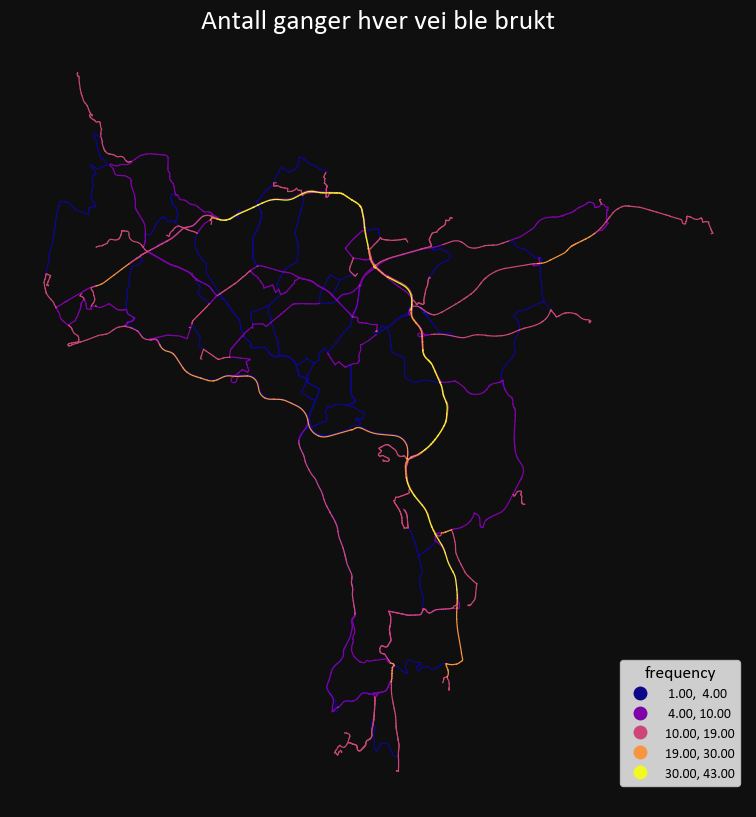

,category,connected,drivetime_bw,drivetime_fw,idx_orig,meters,minutes,frequency,n_source,n_target,oneway,roadid,source,source_wkt,target,target_wkt,geometry
158279,R,1.0,NaN,-1.0,1470658,2.093402,0.002153,43.0,2,2,TF,{R150},78152,POINT (264174.0769999996 6653452.899),78151,POINT (264175.2999999998 6653451.199999999),"LINESTRING Z (264174.077 6653452.899 125.499, ..."
158304,R,1.0,NaN,-1.0,1470784,49.665448,0.051084,43.0,2,2,TF,{R150},78167,POINT (263606.9689999996 6653786.957),78166,POINT (263656.5209999997 6653783.602),"LINESTRING Z (263606.969 6653786.957 120.963, ..."
150505,R,1.0,-1.0,NaN,919666,8.636088,0.008883,43.0,2,2,FT,{R150},73168,POINT (263598.3499999996 6653787.5),78167,POINT (263606.9689999996 6653786.957),"LINESTRING Z (263598.350 6653787.500 121.063, ..."


In [16]:
freq = nwa.get_route_frequencies(punkter.sample(15), punkter.sample(15))

sg.qtm(
    sg.buff(freq, 15),
    "frequency",
    scheme="naturalbreaks",
    cmap="plasma",
    title="Antall ganger hver vei ble brukt",
)

freq.sort_values("frequency", ascending=False).head(3)

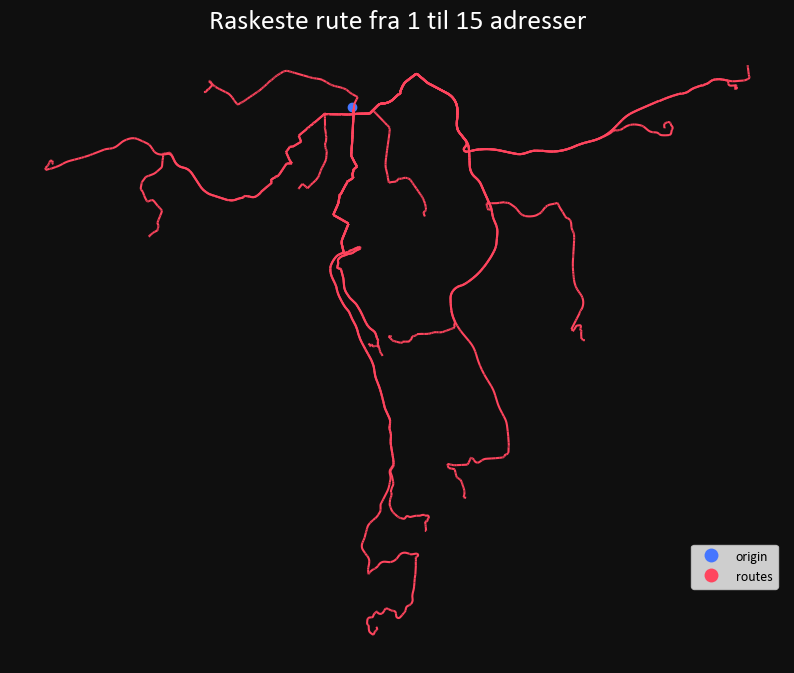

,origin,destination,minutes,geometry
0,0,125,12.306961,MULTILINESTRING Z ((261352.158 6649521.080 6.6...
1,0,165,6.262079,MULTILINESTRING Z ((262841.200 6651029.403 30....
2,0,182,11.218861,MULTILINESTRING Z ((270062.080 6650847.470 180...
3,0,137,13.093079,MULTILINESTRING Z ((258634.540 6648335.068 18....
4,0,108,15.891456,MULTILINESTRING Z ((266612.400 6649059.000 87....
5,0,124,7.026324,MULTILINESTRING Z ((264176.900 6649609.500 57....
6,0,164,17.255069,MULTILINESTRING Z ((265592.530 6642565.390 125...
7,0,117,7.551233,MULTILINESTRING Z ((259890.075 6651526.023 62....
8,0,187,12.672716,MULTILINESTRING Z ((270934.125 6651695.275 166...
9,0,183,17.746041,MULTILINESTRING Z ((264763.395 6641823.502 92....


In [82]:
origin = origins.iloc[[0]]

routes = nwa.get_route(
    origin, 
    destinations.sample(15),
)

sg.qtm(origin, routes, title="Raskeste rute fra 1 til 15 adresser")

routes

c:\Users\ort\AppData\Local\Programs\Python\Python311\Lib\site-packages\mapclassify\classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


,minutes,geometry
0,1,MULTILINESTRING Z ((263122.461 6651267.381 46....
1,2,MULTILINESTRING Z ((263585.029 6651794.619 74....
2,3,MULTILINESTRING Z ((262750.930 6651840.320 63....
3,4,MULTILINESTRING Z ((261565.090 6650650.323 35....
4,5,MULTILINESTRING Z ((265378.000 6650581.600 85....
5,6,MULTILINESTRING Z ((265262.829 6650519.242 78....
6,7,MULTILINESTRING Z ((264348.673 6648271.134 17....
7,8,MULTILINESTRING Z ((266903.800 6651086.560 114...
8,9,MULTILINESTRING Z ((263683.620 6648172.520 20....
9,10,MULTILINESTRING Z ((265657.500 6654844.860 296...


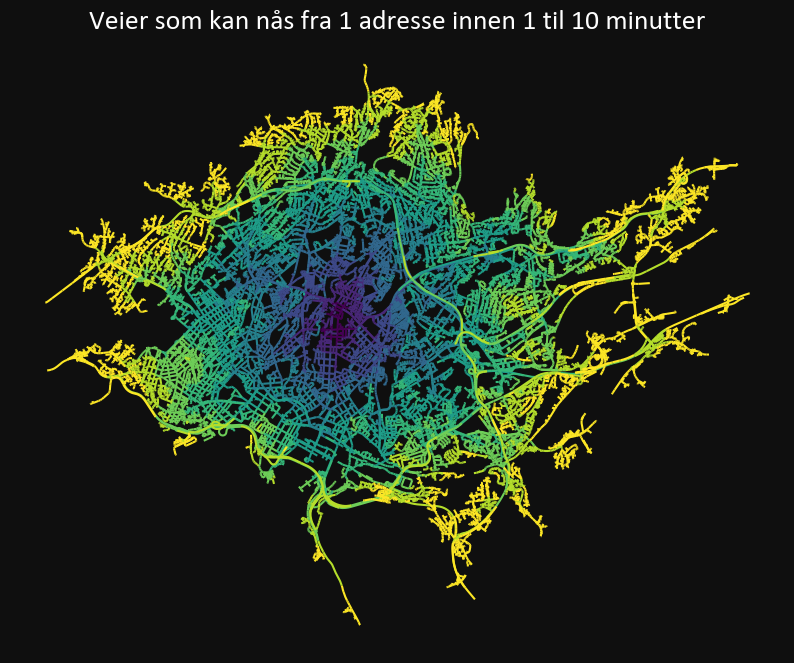

In [81]:
service_areas = nwa.service_area(
    origin,
    breaks=np.arange(1, 11),
)

sg.qtm(service_areas, "minutes", k=10, title="Veier som kan nås fra 1 adresse innen 1 til 10 minutter", legend=False)

service_areas

### OD Cost Matrix

In [83]:
od = nwa.od_cost_matrix(
    origins, 
    destinations, 
)
od

,origin,destination,minutes
0,0,100,8.765621
1,0,101,6.383407
2,0,102,13.482324
3,0,103,6.410121
4,0,104,5.882124
...,...,...,...
9995,99,195,20.488644
9996,99,196,16.721241
9997,99,197,19.977029
9998,99,198,15.233163


Kolonnene 'origin' og 'destination' bruker index-en til inputene.

Man kan derfor enkelt koble resultatene med dataene:

In [84]:
origins_joinet = origins.join(od.set_index("origin"))
origins_joinet

,origin_idx,KOMMUNENR,geometry,minutes_mean,minutes_max,destination,minutes
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537,100,8.765621
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537,101,6.383407
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537,102,13.482324
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537,103,6.410121
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537,104,5.882124
...,...,...,...,...,...,...,...
99,99,0301,POINT (265622.800 6644644.200),12.185800,28.942249,195,20.488644
99,99,0301,POINT (265622.800 6644644.200),12.185800,28.942249,196,16.721241
99,99,0301,POINT (265622.800 6644644.200),12.185800,28.942249,197,19.977029
99,99,0301,POINT (265622.800 6644644.200),12.185800,28.942249,198,15.233163


In [85]:
destinations_joinet = destinations.join(od.set_index("destination"))
destinations_joinet

,destination_idx,KOMMUNENR,geometry,origin,minutes
100,100,0301,POINT (265997.900 6647899.400),0,8.765621
100,100,0301,POINT (265997.900 6647899.400),1,12.590325
100,100,0301,POINT (265997.900 6647899.400),2,11.751821
100,100,0301,POINT (265997.900 6647899.400),3,13.730250
100,100,0301,POINT (265997.900 6647899.400),4,14.290755
...,...,...,...,...,...
199,199,0301,POINT (264980.800 6647231.300),95,13.940570
199,199,0301,POINT (264980.800 6647231.300),96,7.453760
199,199,0301,POINT (264980.800 6647231.300),97,11.475038
199,199,0301,POINT (264980.800 6647231.300),98,17.006176


Eller gi punktene kolonner med aggregerte data:

In [86]:
origins["minutes_mean"] = od.groupby("origin").minutes.mean()
origins["minutes_max"] = od.groupby("origin").minutes.max()
origins

,origin_idx,KOMMUNENR,geometry,minutes_mean,minutes_max
0,0,0301,POINT (263122.700 6651184.900),11.628637,24.241537
1,1,0301,POINT (272456.100 6653369.500),16.084722,29.750538
2,2,0301,POINT (270082.300 6653032.700),15.304246,28.912034
3,3,0301,POINT (259804.800 6650339.700),14.044023,25.100020
4,4,0301,POINT (272876.200 6652889.100),17.565747,31.450968
...,...,...,...,...,...
95,95,0301,POINT (270348.000 6651899.400),15.427027,28.848582
96,96,0301,POINT (264845.600 6649005.800),11.239592,24.890783
97,97,0301,POINT (263162.000 6650732.200),11.904372,23.259892
98,98,0301,POINT (272322.700 6653729.100),17.579399,31.292923


In [58]:
sg.explore(punkter, "minutes_mean")

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(
c:\Users\ort\AppData\Local\Programs\Python\Python311\Lib\site-packages\mapclassify\classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


Hvis man vil bruke en kolonne som id-er heller enn index-en, kan man sette index-en inni funksjonen:

In [88]:
od = nwa.od_cost_matrix(
    origins.set_index("KOMMUNENR"), 
    destinations, 
)
od

,origin,destination,minutes
0,0301,100,8.765621
1,0301,101,6.383407
2,0301,102,13.482324
3,0301,103,6.410121
4,0301,104,5.882124
...,...,...,...
9995,0301,195,20.488644
9996,0301,196,16.721241
9997,0301,197,19.977029
9998,0301,198,15.233163


In [ ]:
od.groupby

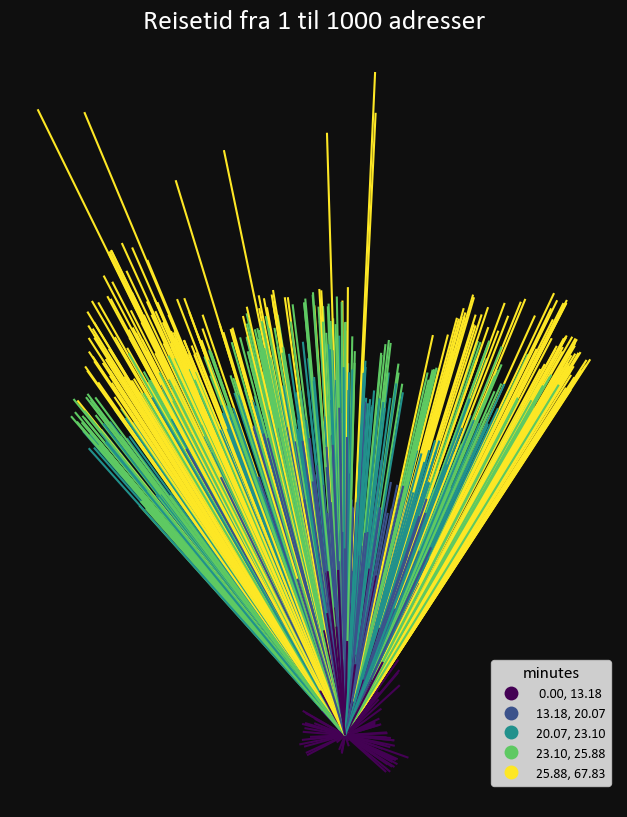

,origin,destination,minutes,geometry
0,159,0,20.450744,"LINESTRING (265189.000 6640024.800, 263122.700..."
1,159,1,26.519389,"LINESTRING (265189.000 6640024.800, 272456.100..."
2,159,2,25.646059,"LINESTRING (265189.000 6640024.800, 270082.300..."
3,159,3,19.914157,"LINESTRING (265189.000 6640024.800, 259804.800..."
4,159,4,28.221853,"LINESTRING (265189.000 6640024.800, 272876.200..."
...,...,...,...,...
995,159,995,17.923571,"LINESTRING (265189.000 6640024.800, 266801.700..."
996,159,996,24.705563,"LINESTRING (265189.000 6640024.800, 261274.000..."
997,159,997,15.846561,"LINESTRING (265189.000 6640024.800, 263542.900..."
998,159,998,21.683155,"LINESTRING (265189.000 6640024.800, 269226.700..."


In [13]:
od = nwa.od_cost_matrix(
    punkter.sample(1), 
    punkter, 
    lines=True
)

sg.qtm(od, "minutes", title="Reisetid fra 1 til 1000 adresser", scheme="quantiles")

od

### Service area

In [14]:
origins = punkter.sample(100)
destinations = punkter.sample(100)

od = nwa.od_cost_matrix(
    origins, 
    destinations, 
)

display(od)

joined = origins.join(od.set_index("origin"))

display(joined)

origins["minutes_mean"] = od.groupby("origin")["minutes"].mean()
origins["minutes_max"] = od.groupby("origin")["minutes"].max()
origins

,origin,destination,minutes
0,929,607,10.667839
1,929,924,17.749869
2,929,579,8.389510
3,929,961,13.931430
4,929,693,8.713461
...,...,...,...
9995,324,385,10.889581
9996,324,609,18.374290
9997,324,321,12.811243
9998,324,283,21.616153


,idx,geometry,destination,minutes
7,8,POINT (261664.600 6650990.000),607,16.044038
7,8,POINT (261664.600 6650990.000),924,21.224921
7,8,POINT (261664.600 6650990.000),579,13.861477
7,8,POINT (261664.600 6650990.000),961,17.561740
7,8,POINT (261664.600 6650990.000),693,14.872449
...,...,...,...,...
995,996,POINT (266801.700 6647844.500),385,14.490748
995,996,POINT (266801.700 6647844.500),609,7.995618
995,996,POINT (266801.700 6647844.500),321,16.308484
995,996,POINT (266801.700 6647844.500),283,11.235492


,idx,geometry,minutes_mean,minutes_max
929,930,POINT (268159.400 6646511.500),15.286166,27.179644
828,829,POINT (265881.700 6647007.800),12.747042,23.307767
140,141,POINT (263377.100 6654899.200),14.042634,26.933580
552,553,POINT (263209.200 6650661.400),12.086597,21.365129
528,529,POINT (265018.600 6646055.400),12.472114,24.472205
...,...,...,...,...
354,355,POINT (272706.900 6653424.900),17.950692,29.348185
523,524,POINT (263106.900 6655142.800),15.255641,28.213571
659,660,POINT (264568.400 6643040.400),16.167445,28.076703
808,809,POINT (260275.700 6650746.400),12.864060,24.022948


In [19]:
nwa.log

,endtime,minutes_elapsed,method,origins_count,destinations_count,percent_missing,cost_mean,isolated_removed,percent_bidirectional,weight,...,nodedist_multiplier,nodedist_kmh,cost_p25,cost_median,cost_p75,cost_std,lines,rowwise,breaks,dissolve
0,2023-03-27 21:43:31,0.1,od_cost_matrix,1,1000.0,0.4,20.221049,True,87,minutes,...,None,None,15.690606,21.448194,25.088168,7.387229,True,False,NaN,NaN
1,2023-03-27 21:43:40,0.1,od_cost_matrix,100,100.0,0.0,15.265924,True,87,minutes,...,None,None,10.793170,15.021395,19.407644,6.117373,False,False,NaN,NaN
2,2023-03-27 21:43:46,0.1,service_area,1,NaN,0.0,5.500000,True,87,minutes,...,None,None,3.250000,5.500000,7.750000,3.027650,NaN,NaN,"1, 2, 3, 4, 5, 6, 7, 8, 9, 10",True
3,2023-03-27 21:44:00,0.2,get_route_frequencies,15,15.0,0.0,0.068643,True,87,minutes,...,None,None,0.012974,0.038076,0.088280,0.091760,NaN,NaN,NaN,NaN
4,2023-03-27 21:44:11,0.1,get_route,1,15.0,0.0,12.484852,True,87,minutes,...,None,None,10.098296,12.012722,14.100040,4.481518,NaN,False,NaN,NaN
5,2023-03-27 21:44:19,0.1,get_k_routes,1,1.0,0.0,17.731003,True,87,minutes,...,None,None,13.938539,17.188701,20.981165,4.945262,NaN,False,NaN,NaN


## GIS-funksjoner som mangler i geopandas

### Feature to line
Gjør én eller flere GeoDataFrames til linjer.

In [20]:
import sgis as sg
from shapely.geometry import Polygon
poly1 = sg.to_gdf(Polygon([(0, 0), (0, 1), (1, 1), (1, 0)]))
poly1["poly1"] = 1
poly1

,geometry,poly1
0,"POLYGON ((0.00000 0.00000, 0.00000 1.00000, 1....",1


In [21]:
line = sg.to_lines(poly1)
line

,geometry,poly1
0,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ...",1


,poly1,poly2,geometry
0,1.0,NaN,"LINESTRING (0.00000 0.00000, 0.00000 1.00000, ..."
1,1.0,NaN,"LINESTRING (0.50000 1.00000, 1.00000 1.00000, ..."
2,1.0,NaN,"LINESTRING (1.00000 0.50000, 1.00000 0.00000, ..."
3,NaN,1.0,"LINESTRING (0.50000 0.50000, 0.50000 1.00000)"
4,NaN,1.0,"LINESTRING (0.50000 1.00000, 0.50000 1.50000, ..."
5,NaN,1.0,"LINESTRING (1.00000 0.50000, 0.50000 0.50000)"


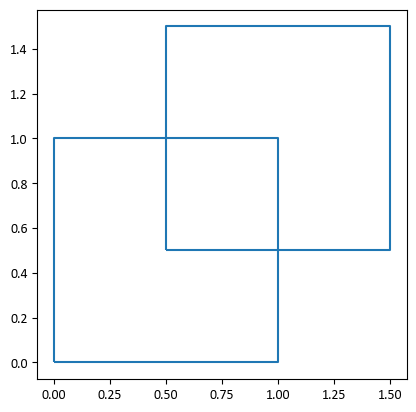

In [22]:
poly2 = sg.to_gdf(Polygon([(0.5, 0.5), (0.5, 1.5), (1.5, 1.5), (1.5, 0.5)]))
poly2["poly2"] = 1

lines = sg.to_lines(poly1, poly2)

lines

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(
C:\Users\ort\git\ssb-sgis\src\sgis\maps.py:388: UserWarning: The label '___' of <matplotlib.lines.Line2D object at 0x000002AA0C2F5650> starts with '_'. It is thus excluded from the legend.
  ax.legend(patches, categories, fontsize=size_x)


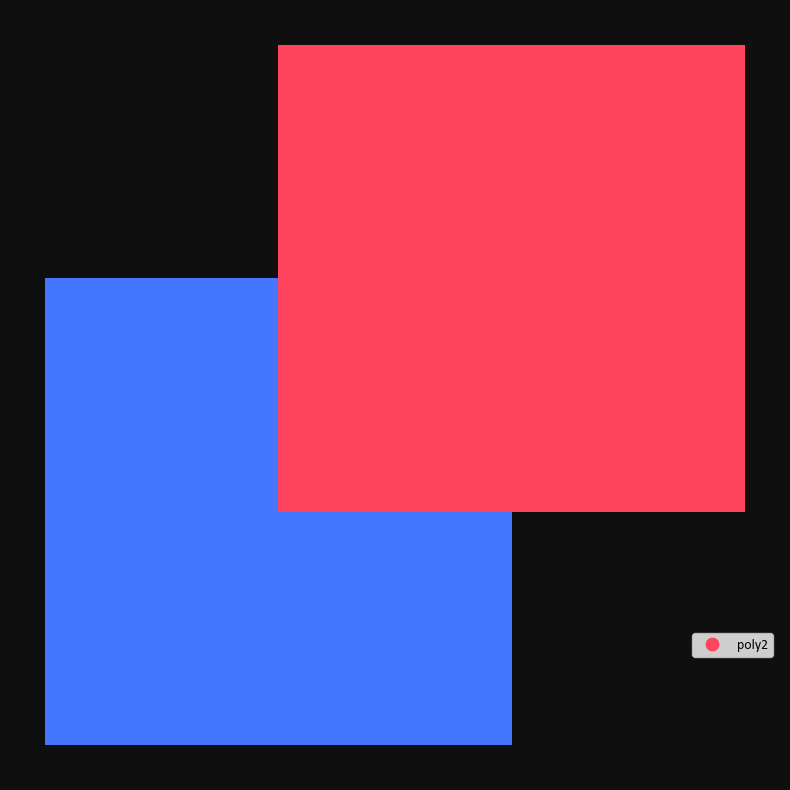

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(
c:\Users\ort\AppData\Local\Programs\Python\Python311\Lib\site-packages\mapclassify\classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


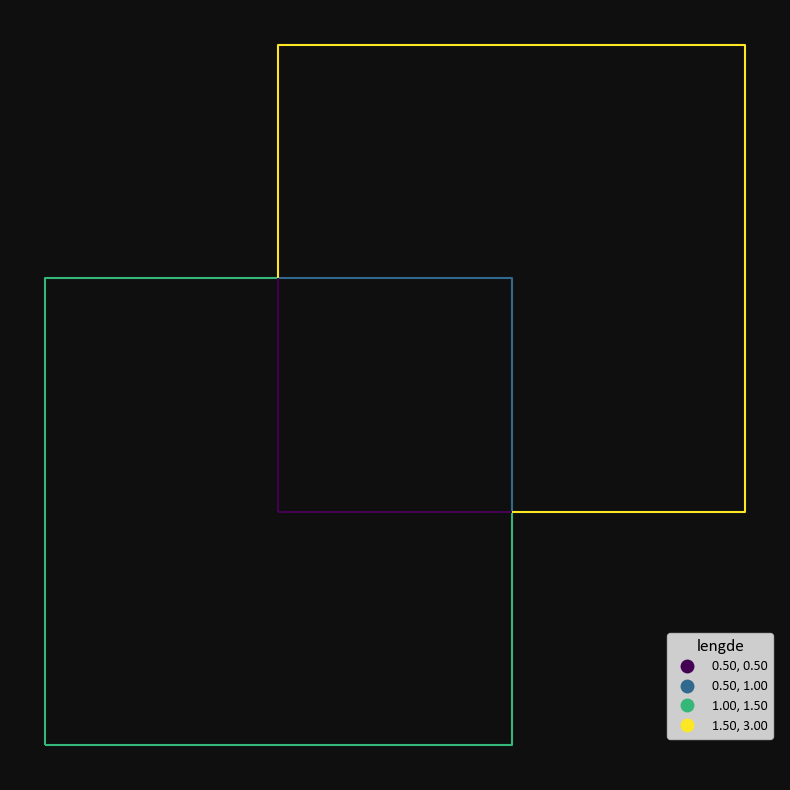

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [23]:
sg.qtm(poly1, poly2)
lines["lengde"] = lines.length
sg.qtm(lines, "lengde")

### Tette hull i polygoner
Lager et polygon med to hull.

In [24]:
kommuner = gpd.read_file(r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\data\ABAS_kommune_flate_p2023_v1.gpkg")
kommuner = kommuner[["KOMMUNENR", "FYLKE", "geometry"]]

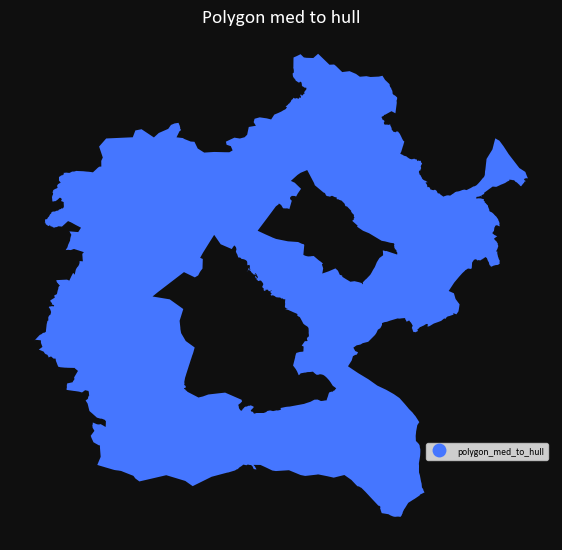

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Polygon med to hull'}>)

In [25]:
hol = kommuner.loc[kommuner.KOMMUNENR == "3044"]
hols_naboer = kommuner.loc[kommuner.touches(hol.unary_union)]

hemsedal = kommuner.loc[kommuner.KOMMUNENR == "3042"]
hemsedals_naboer = kommuner.loc[kommuner.touches(hemsedal.unary_union)]

polygon_med_to_hull = pd.concat([hols_naboer, hemsedals_naboer]).pipe(sg.dissexp)

sg.qtm(polygon_med_to_hull, title="Polygon med to hull", size=7)

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Alle hull tettet'}>)

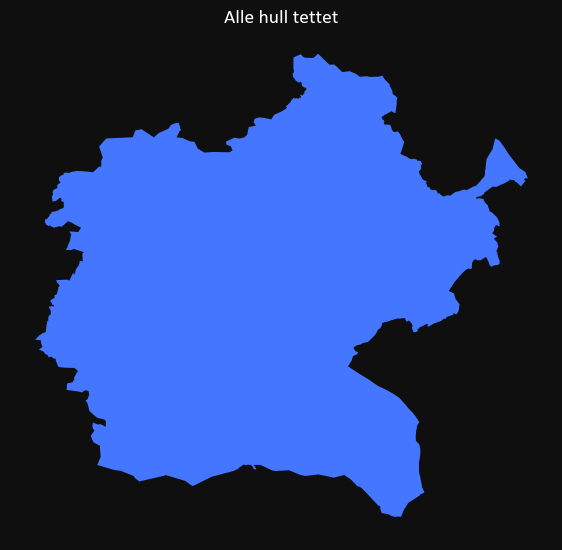

In [26]:
alle_hull_tettet = sg.close_all_holes(polygon_med_to_hull)

sg.qtm(alle_hull_tettet, title="Alle hull tettet", size=7, legend=False)

(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Hull under 1000 km2 tettet'}>)

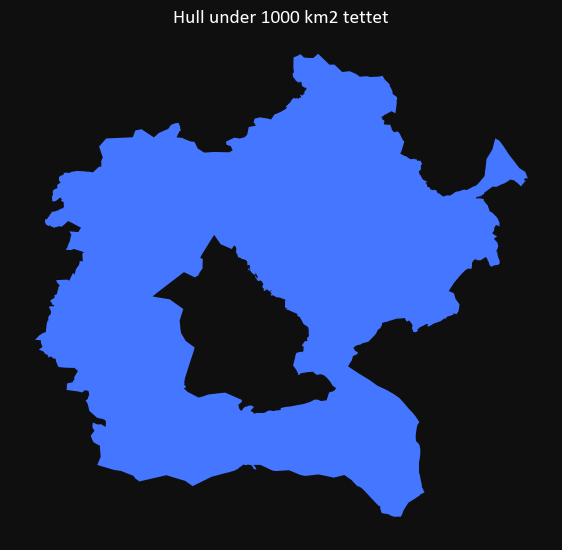

In [27]:
smaa_hull_tettet = sg.close_small_holes(polygon_med_to_hull, max_area=1000 * 1_000_000)

sg.qtm(smaa_hull_tettet, title="Hull under 1000 km2 tettet", size=7, legend=False)

### Repair geometry

Det vil si, hvis man vil reparere, fjerne tomme og manglende geometrier og beholde bare én geometritype (multi- og singlepart). 

is_valid = False


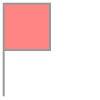

In [28]:
from shapely.geometry import Polygon
invalid_geometry = Polygon([(0,1), (0,0), (0,1),(1,1),(1,2),(0,2),(0,0)])
print("is_valid =", invalid_geometry.is_valid)
invalid_geometry

In [29]:
invalid_geometry = sg.to_gdf(invalid_geometry)

empty_geometry = sg.to_gdf("POINT (0 0)").pipe(sg.buff, 0)

missing_geometry = gpd.GeoDataFrame(
    {"geometry": [None]}, geometry="geometry", crs=25833
)

gdf = pd.concat([invalid_geometry, missing_geometry, empty_geometry])

gdf["valid"] = gdf.is_valid

gdf

c:\Users\ort\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as ETRS89 / UTM zone 33N (the single non-null crs provided).
  warnings.warn(


,geometry,valid
0,"POLYGON ((0.000 1.000, 0.000 0.000, 0.000 1.00...",False
0,None,False
0,POLYGON EMPTY,True


Reparering med geopandas:

In [30]:
gdf.make_valid()

0    GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...
0                                                 None
0                                        POLYGON EMPTY
dtype: geometry

For å fjerne tomme og manglende:

In [31]:
gdf = sg.clean_geoms(gdf)
gdf

,geometry,valid
0,"GEOMETRYCOLLECTION (POLYGON ((0.000 2.000, 1.0...",False


Man får likevel en geometritype som er håpløs å jobbe med (geometrycollection).

Og for å få riktig geometritype:

In [32]:
gdf = sg.to_single_geom_type(gdf, "polygon")
gdf

,geometry,valid
0,"POLYGON ((0.000 2.000, 1.000 2.000, 1.000 1.00...",False


### Snap punkter

In [33]:
snap_til = sg.buff(punkter.iloc[[0]], 500)

sg.explore(snap_til, punkter)

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(


In [34]:
snappede_punkter = sg.snap_all(punkter, snap_til)

snappede_punkter

,idx,geometry
0,1,POINT (263383.917 6650758.633)
1,2,POINT (263610.658 6651293.972)
2,3,POINT (263606.992 6651309.245)
3,4,POINT (262638.408 6651060.555)
4,5,POINT (263614.865 6651272.738)
...,...,...
995,996,POINT (263496.070 6650852.392)
996,997,POINT (262816.246 6651579.978)
997,998,POINT (263154.095 6650685.887)
998,999,POINT (263620.481 6651137.846)


In [35]:
sg.explore(snap_til, snappede_punkter)

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(


In [36]:
snappede_punkter = sg.snap_within_distance(punkter, snap_til, max_dist=5000)
snappede_punkter

,idx,geometry
0,1,POINT (263383.917 6650758.633)
1,2,POINT (272456.100 6653369.500)
2,3,POINT (270082.300 6653032.700)
3,4,POINT (262638.408 6651060.555)
4,5,POINT (272876.200 6652889.100)
...,...,...
995,996,POINT (263496.070 6650852.392)
996,997,POINT (262816.246 6651579.978)
997,998,POINT (263542.900 6645427.000)
998,999,POINT (269226.700 6650628.000)


In [37]:
sg.explore(snap_til, snappede_punkter)

C:\Users\ort\git\ssb-sgis\src\sgis\helpers.py:58: UserWarning: More than one local variable matches the object. Name might be wrong.
  warnings.warn(


### Forenkling av geopandas-kode

Hvis man vil bufre uten å overskrive originaldata, og slå sammen overlappende polygoner basert på flere kolonner:

In [45]:
# buffer
kopi = kommuner.copy()
kopi["geometry"] = kopi.buffer(100, resolution=50)
kopi["geometry"] = kopi["geometry"].make_valid()

# dissolve
dissolvet = kopi.dissolve(by=["KOMMUNENR", "FYLKE"], as_index=False)
dissolvet["geometry"] = dissolvet["geometry"].make_valid()

#explode
singlepart = dissolvet.explode(index_parts=False)

singlepart

,KOMMUNENR,FYLKE,geometry
0,0301,03,"POLYGON ((248563.736 6661874.610, 248562.678 6..."
1,1101,11,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,1103,11,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,1106,11,"POLYGON ((-88966.475 6642429.151, -88969.253 6..."
4,1108,11,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...
351,5440,54,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,5441,54,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,5442,54,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,5443,54,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


Eller:

In [46]:
singlepart2 = sg.buffdissexp(kommuner, 100, by=["KOMMUNENR", "FYLKE"], as_index=False)
singlepart2

,KOMMUNENR,FYLKE,geometry
0,0301,03,"POLYGON ((248563.736 6661874.610, 248562.678 6..."
1,1101,11,"POLYGON ((-32817.241 6518341.030, -32816.472 6..."
2,1103,11,"POLYGON ((-42729.760 6593061.884, -42730.533 6..."
3,1106,11,"POLYGON ((-88966.475 6642429.151, -88969.253 6..."
4,1108,11,"POLYGON ((-41122.798 6558890.903, -41124.463 6..."
...,...,...,...
351,5440,54,"POLYGON ((994912.306 7897416.543, 991508.693 7..."
352,5441,54,"POLYGON ((934373.725 7789133.631, 934368.766 7..."
353,5442,54,"POLYGON ((1000798.805 7843627.847, 1001277.815..."
354,5443,54,"POLYGON ((1033019.331 7899722.819, 1033015.432..."


In [47]:
singlepart.equals(singlepart2)

True

In [41]:
sg.buff(kommuner, 100)

,KOMMUNENR,FYLKE,geometry
0,1560,15,"POLYGON ((137831.299 7007464.474, 137829.102 7..."
1,1563,15,"POLYGON ((159058.302 6950819.619, 158016.929 6..."
2,1566,15,"POLYGON ((159121.328 7005852.196, 159122.331 7..."
3,1573,15,"POLYGON ((106938.443 7057560.839, 106936.227 7..."
4,1576,15,"POLYGON ((167329.808 7043000.192, 167331.953 7..."
...,...,...,...
351,5433,54,"POLYGON ((726362.754 7865472.379, 726361.411 7..."
352,5434,54,"POLYGON ((795965.813 7918313.530, 795963.835 7..."
353,5435,54,"POLYGON ((880851.236 7903952.258, 878037.873 7..."
354,5436,54,"POLYGON ((860048.700 7835011.904, 861019.834 7..."


In [48]:
sg.dissexp(kommuner, by="FYLKE")

,KOMMUNENR,geometry
FYLKE,,
03,0301,"POLYGON ((248657.280 6661909.960, 248685.810 6..."
11,1101,"POLYGON ((-56493.690 6508636.440, -59095.100 6..."
15,1560,"POLYGON ((104161.500 6907210.720, 104544.500 6..."
18,1804,"POLYGON ((355569.960 7222811.560, 355387.970 7..."
30,3001,"POLYGON ((181826.290 6633764.430, 181829.230 6..."
34,3401,"POLYGON ((189999.140 6740694.890, 189997.490 6..."
38,3801,"POLYGON ((187026.350 6607473.790, 187031.200 6..."
42,4206,"POLYGON ((74935.480 6428254.040, 74211.540 642..."
46,4601,"POLYGON ((-32673.700 6646701.810, -32756.210 6..."


In [49]:
sg.dissexp(kommuner)

,KOMMUNENR,FYLKE,geometry
0,1560,15,"POLYGON ((-2346.470 6446307.800, -3205.780 644..."


In [50]:
sg.buffdiss(kommuner, 100, by="FYLKE")

,geometry,KOMMUNENR
FYLKE,,
03,"POLYGON ((248563.736 6661874.610, 248562.678 6...",0301
11,"POLYGON ((-54116.885 6504826.326, -56577.335 6...",1101
15,"POLYGON ((104306.314 6907216.910, 104610.337 6...",1560
18,"POLYGON ((355339.271 7219435.910, 355102.752 7...",1804
30,"POLYGON ((181888.067 6633648.803, 181834.997 6...",3001
34,"POLYGON ((189908.458 6740638.635, 189906.525 6...",3401
38,"POLYGON ((163565.412 6541879.361, 163562.863 6...",3801
42,"POLYGON ((77278.528 6428849.472, 74964.098 642...",4206
46,"POLYGON ((-29481.600 6655233.190, -29481.644 6...",4601
